<div style="text-align: right"> <b>[M1 info ML] Réduction de dimensions - 2020/2021</b> </div>
<div style="text-align: right"> <b>TDTP1</b> </div>
<div style="text-align: right"> <a href="mailto:mohamed.maouche@univ-lille.fr"> M. Maouche </a> </div>



# Partie 1 : Vecteurs Propres et Valeurs Propres

## I - Méthode Exacte

Nous avons $A=\begin{bmatrix}
34 & 12 \\
12 & 41 
\end{bmatrix}$ 

1- Calculez les valeurs propres et les vecteurs propres de $A$ avec la méthode du **déterminant**.

$$det(A - \lambda I_{n})= det(\begin{bmatrix}
34 -\lambda & 12 \\
12 & 41 -\lambda
\end{bmatrix}) = (34 -\lambda) * (41 -\lambda) - 12^{2} = 0$$

$$ = \lambda^{2} - 75\lambda + 1250 = (\lambda - 25) * (\lambda - 50) $$

Du coup on a :

$$ (A - 25I)p1 = 0  <=> p1 = \begin{bmatrix}3  \\  4 \end{bmatrix}$$
$$ (A - 50I)p2 = 0  <=> p2 = \begin{bmatrix}-4  \\  3 \end{bmatrix}$$

Les valeurs propores sont: 
$$\lambda{1} = 25, \lambda{2} = 50 $$

On a donc:

$$ A*p1 = \lambda{1}*p1  $$

2 - Dessinez les vecteurs propres $p_1$ et $p_2$ et les vecteurs $\overrightarrow{i}=\begin{bmatrix}
1  \\  0 \end{bmatrix}$ et $\overrightarrow{j}=\begin{bmatrix}
0  \\  1\end{bmatrix}$  dans le plan.

In [1]:
import matplotlib.pyplot as plt
import numpy as np
import plotly.express as px

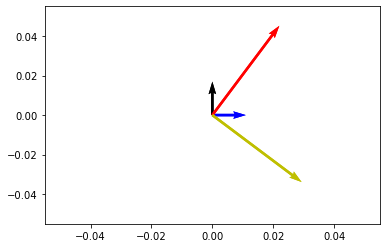

In [2]:
p1 = np.array([3,4])
p2 = np.array([4,-3])
i = np.array([1,0])
j = np.array([0,1])
origin = np.array([[0, 0],[0, 0]])

plt.quiver(*origin, i[0], i[1], color=['b'], scale=10)
plt.quiver(*origin, j[0], j[1], color=['black'], scale=10)
plt.quiver(*origin, p1[0], p1[1], color=['r'], scale=15)
plt.quiver(*origin, p2[0], p2[1], color=['y'], scale=15)

plt.show()

3 - Dessinez dans une nouvelle figure $Ax_1$, $Ax_2$, $A\overrightarrow{i}$ et $A\overrightarrow{j}$. 

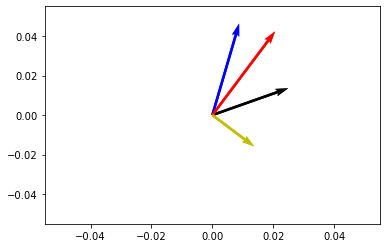

In [3]:
A = np.array([ [34, 12], [12, 41] ])

v1 = A@p1
v2 = A@p2
v3 = A@i
v4 = A@j

plt.quiver(*origin, v4[0], v4[1], color=['b'], scale=150)
plt.quiver(*origin, v3[0], v3[1], color=['black'], scale=150)
plt.quiver(*origin, v1[0], v1[1], color=['r'], scale=800)
plt.quiver(*origin, v2[0], v2[1], color=['y'], scale=800)

plt.show()

4 - Que remarquez vous ?

In [4]:
print("𝐴∗𝑝1=𝜆1∗𝑝1 ?")
print(v1, 50*p1)
print("𝐴∗𝑝2=𝜆2∗𝑝2 ?")
print(v2, 25*p2)

𝐴∗𝑝1=𝜆1∗𝑝1 ?
[150 200] [150 200]
𝐴∗𝑝2=𝜆2∗𝑝2 ?
[100 -75] [100 -75]


- On remarque aussi, que Ap1 et Ap2 ne changent pas de directions.
- Les vecteurs unitaires i et j, dévient de leur directions.

## II - Méthode Numérique

 Pour découvrir les vecteurs propres de manière numérique, nous pouvons utiliser une méthode itérative. Pour cela, considérons cette suite : $ x_{k+1}\gets \dfrac{Ax_k}{||Ax_k||}$, nous nous arrêtons lorsque $||x_{k+1}-x_k||\leq \epsilon$

1 - Donnez une intuition sur pourquoi cette suite converge vers un vecteur propre.



Correct:
- on arrive à $x{k}^i$

2 - Testez avec la matrice A manuellement pour quelques itérations puis avec python. Vous posez $x_0=\begin{bmatrix}1 \\   1 \end{bmatrix}$ ou  $x_0=\begin{bmatrix}\sqrt{2}^{-1}  \\   \sqrt{2}^{-1} \end{bmatrix}$ 

**Attention :** python gère bizzarement les matrices 1D,  si p.shape = k  alors p.T ne sera pas égale à (1,k) mais toujours k 

Solution possible : forcez une matrice 2D avec shape égale à (1,k) ou (k,1)
Par example avec ```p=np.ones((A.shape[0],1))``` ou alors ```p=p.reshape((-1, 1))```

In [5]:
def vect_propre(A, x_0, verbose=False):
    for i in range(100):
        x_i = (A@x_0) / (np.linalg.norm(A@x_0))
        if verbose:
            print(i, np.linalg.norm(x_0 - x_i))
        if np.linalg.norm(x_0 - x_i) == 0:
            break
        x_0 = x_i
    return x_i

x_0 = np.ones((A.shape[0],1))
vect_prp1 = vect_propre(A,x_0)

print("vect propore:")
print(vect_prp1)

vect propore:
[[0.6]
 [0.8]]


In [6]:
x_0 = np.ones((A.shape[0],1))
x_0[0][0] = np.sqrt(1/2)
x_0[1][0] = np.sqrt(1/2)
vect_prp1_1 = vect_propre(A,x_0)

print("vect propore :")
print(vect_prp1_1)

vect propore :
[[0.6]
 [0.8]]


3 - Si $p_i$ est un vecteur propre, comment retrouve-t-on $\lambda_i$ ?

On sait que si $p_{i}$ est un vecteur propre de la martice A, et que $\lambda_{i}$ est une valeur propore de A, alors:  
$$A p_{i} = \lambda_{i}p_{i} $$

$$ \begin{bmatrix}34 & 12 \\ 12 & 41 \end{bmatrix} * \begin{bmatrix}0.6 \\ 0.8 \end{bmatrix} = \begin{bmatrix}0.6\lambda_{i} \\ 0.8\lambda_{i}\end{bmatrix}$$

On doit donc résoudre :

$$ 0.6*34 + 12*0.8 = 0.6\lambda <=> 30 = 0.6\lambda$$  
$$ 0.6*12 + 41*0.8 = 0.8\lambda <=> 40 = 0.8\lambda$$
$$ \lambda = 50 $$

In [7]:
print(A@vect_prp1)
print(50*vect_prp1)

[[30.]
 [40.]]
[[30.]
 [40.]]


4 - Quelle est la valeur propre du vecteur propre trouvé dans la question précédente ?

- **50**

In [8]:
def val_propre(A, vect):
    return [(A@vect)/vect][0][0][0]
  
vect_prp0 = np.array([3, 4]).reshape(2,1)
lambda0 = val_propre(A, vect_prp0)
print("lambda0: " + str(lambda0))

lambda1 = val_propre(A, vect_prp1)
print("lambda1: " + str(lambda1))

lambda0: 50.0
lambda1: 50.0


5 - Comment faire en sorte que la méthode numérique retrouve un autre vecteur propre ?

- D'après la doc sur internet ( https://moodle.utc.fr/file.php/665/MT09-ch8.pdf )  
- On peut utiliser les méthodes de déflatation (slide 13)

In [9]:
AA = A - lambda1*vect_prp1*vect_prp1.T

x_0 = np.ones((A.shape[0],1))
vect_prp2 = vect_propre(AA, x_0)
print("vect_prp2 :")
print(vect_prp2)

vect_prp2 :
[[ 0.8]
 [-0.6]]


6 - Retrouvez la deuxième valeur propre de la matrice $A$.

Attention ```x@x.T``` ne fait pas forcément ce que vous souhaitez.

In [10]:
val_prp2 = val_propre(AA, vect_prp2)
print("val_prp2 :")
print(val_prp2)

val_prp2 :
25.0


7 - Comparez vos résultats avec la méthode de ```numpy.linalg.eig```

In [11]:
np.linalg.eig(A)

(array([25., 50.]),
 array([[-0.8, -0.6],
        [ 0.6, -0.8]]))

8 - Vérifiez que $PP^T = I$

In [12]:
np.linalg.eig(A)[1]@np.linalg.eig(A)[1].T

array([[1., 0.],
       [0., 1.]])

9 - Extraire les vecteurs propres et valeurs propres de la matrice $B=\begin{bmatrix}
5 & 7 & 3 \\
7 & 4 & 0 \\
3 & 0 & 7
\end{bmatrix}$ à l'aide de la méthode numérique.

Attention : la méthode numérique ne fonctionne pas pour toute matrice carrée, elle fonctionne seulement lorsque $\lambda > 0$.

In [13]:
def deflat(A, val_prp, vect_prp):
    return A - val_prp * vect_prp * vect_prp.T


B = np.array([ [5,7,3],
               [7,4,0],
               [3,0,7]])

x_0 = np.ones((B.shape[0],1))
for i in range(3):
    vect_prp = vect_propre(B, x_0)
    val_prp = val_propre(B, vect_prp)
    print("val_prp : " + str(val_prp))
    print("vect_prp :")
    print(vect_prp)
    
    B = deflat(B, val_prp, vect_prp)

val_prp : 12.450096878526537
vect_prp :
[[0.70901861]
 [0.58734596]
 [0.39027854]]
val_prp : 6.502222529772683
vect_prp :
[[-0.14882622]
 [-0.41634328]
 [ 0.89694428]]
val_prp : -2.952319408299223
vect_prp :
[[-0.68930644]
 [ 0.69403386]
 [ 0.20778265]]


In [14]:
np.linalg.eig(B)

(array([ 1.51811080e-15, -4.08380614e-16, -8.27738905e-17]),
 array([[-0.10755742, -0.6961359 ,  0.70980716],
        [-0.38450606,  0.68751945,  0.61601307],
        [ 0.91683504,  0.20666838,  0.34161629]]))

# Partie 2 : PCA

## I - Données Synthétiques

In [15]:
%matplotlib inline
#%matplotlib notebook
import seaborn as sns
sns.set(style="darkgrid")
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt

Vous trouverez ci-dessous dans la Figure A les données ```points``` générés aléatoirement autour d'une ligne.

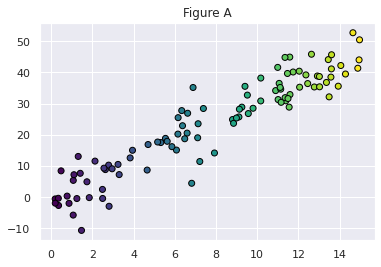

In [16]:
fig, ax = plt.subplots()
a = 3
b = 5
x1data = 15 * np.random.random(100)
x2data = a*x1data + b * np.random.randn(100)
ax.scatter(x1data, x2data, c=x1data, cmap='viridis',edgecolor="black")
plt.title("Figure A")
points = np.vstack((x1data,x2data)).T

1 - Calculer la matrice de covariance $C$ des données ```points``` 

In [17]:
c = np.cov(points.T)
c

array([[ 20.78577055,  65.49186262],
       [ 65.49186262, 234.08128482]])

2 - Avons nous oublier quelque chose ? 

La normalisation ?

In [18]:
np.mean(points,axis=0)

array([ 7.78839931, 23.54092886])

In [19]:
# V0
from sklearn.preprocessing import StandardScaler
points_scaled = StandardScaler().fit_transform(points)
print("mean after scale: ", np.mean(points_scaled,axis=0), '\n')

c = np.cov(points_scaled.T)
print(c,'\n')
c = points_scaled.T@points_scaled
print(c,'\n')
c = np.cov(points_scaled.T)
print(c,'\n')

mean after scale:  [8.88178420e-18 4.13002965e-16] 

[[1.01010101 0.94838732]
 [0.94838732 1.01010101]] 

[[100.          93.89034427]
 [ 93.89034427 100.        ]] 

[[1.01010101 0.94838732]
 [0.94838732 1.01010101]] 



In [20]:
# V1
points_scaled = points - points.mean(axis=0)
points_scaled = points_scaled / points.std(axis=0)
print("mean after scale: ", np.mean(points_scaled,axis=0), '\n')

mean after scale:  [8.88178420e-18 4.13002965e-16] 



3 - Extraire les vecteurs $P$ et valeurs propres $\Lambda$ de $C$

In [21]:
vals, vects = np.linalg.eigh(c)
vals, vects

(array([0.06171369, 1.95848833]),
 array([[ 0.70710678, -0.70710678],
        [-0.70710678, -0.70710678]]))

4 - Donnez le pourcentage de variance expliquée par chaque vecteur propre.

In [22]:
exp_var = []
for v in vals:
    exp_var += [v / vals.sum()]
    
print(exp_var)

[0.030548278629565464, 0.9694517213704344]


4 - Reprenez la figure A et rajoutez-y vos vecteurs propres à l'aide de la fonction ci-dessous (les vecteurs démarreront du centre des données et leur longueur dépendra de leur ratio de variance expliquée).

In [23]:
# Permet de dessiner un vecteur entre deux points
def draw_vector(v0, v1, ax=None):
    ax = ax or plt.gca()
    arrowprops=dict(arrowstyle='->',
                    linewidth=2,
                    shrinkA=0, shrinkB=0, color='red')
    ax.annotate('', v1, v0, arrowprops=arrowprops)

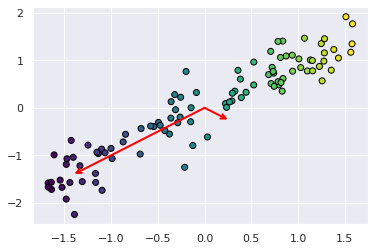

In [24]:
plt.scatter(points_scaled[:,0],points_scaled[:,1], c=points_scaled[:,0], cmap='viridis',edgecolor="black")
for prct, vector in zip(exp_var, vects):
    v = vector*2*np.sqrt(prct)
    draw_vector([0, 0] , v)

5 - Projeter vos données sur les axes $P$ puis dessinez les en utilisant ```plt.axis('scaled')```.

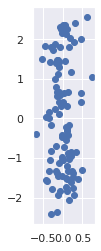

In [25]:
z = points_scaled@vects
plt.scatter(z[:,0],z[:,1])
plt.axis('scaled');

6 - A partir de maintenant nous utiliserons :

``
from sklearn.decomposition import PCA
pca = PCA()
``

En vous servant de la documentation, quelle est la différence entre ```PCA``` et ```eig``` ?

- PCA = eig + normalization
- D'aprés la doc, la fonction eig est égale à SVD

### Données en losange

Vous trouverez ci-dessous des données 2D sous forme d'un losange (Figure B).

Text(0.5, 1.0, 'Dimond data - Figure B')

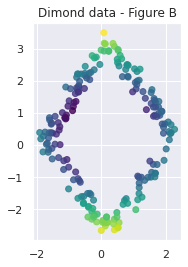

In [26]:
rng = np.random.RandomState(25)
dimondPoints= np.array([[0,3],[2,0],[0,-3],[-2,0]])
N = 200
points = []
for k in range(N):
    # Random point
    i = rng.randint(4)
    p1 = dimondPoints[i]
    p2 = dimondPoints[(i+1)%4]
    # Random ratio
    r = rng.rand()
    x = r * p1 + (1-r)*p2  + 0.5*rng.rand(2)
    points.append(x)
points=np.array(points)
colors = np.linalg.norm(points - np.mean(points,axis=0),axis=1)
plt.scatter(points[:, 0], points[:, 1],c=colors,cmap='viridis',alpha=0.8)
plt.axis('scaled')
plt.title('Dimond data - Figure B')

1 - Appliquez ```PCA``` sur ces données. Affichez ```pca.components_``` et ```pca.explained_variance_ratio_```.

In [27]:
from sklearn.decomposition import PCA

pca = PCA(n_components=2)
pca.fit(points)
pca.components_ , pca.explained_variance_ratio_

(array([[ 0.03369326,  0.99943222],
        [ 0.99943222, -0.03369326]]),
 array([0.68405249, 0.31594751]))

2 - Dessinez sur la Figure B les composantes principales (CPs) à l'aide de ```draw_vector```.

(-2.1217131992588296,
 2.488385334157768,
 -2.9582441930255086,
 3.799199994143619)

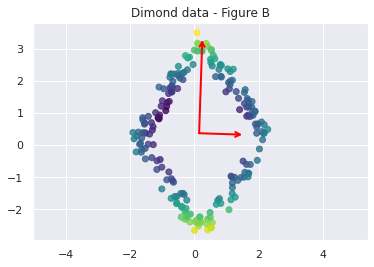

In [28]:
plt.scatter(points[:, 0], points[:, 1],c=colors,cmap='viridis',alpha=0.8)
plt.axis('scaled')
plt.title('Dimond data - Figure B')
for length, vector in zip(pca.explained_variance_, pca.components_):
    v = vector * length
    draw_vector(pca.mean_, pca.mean_ + v)
plt.axis('equal')

3 - Dessinez les données projetées sur les CPs.

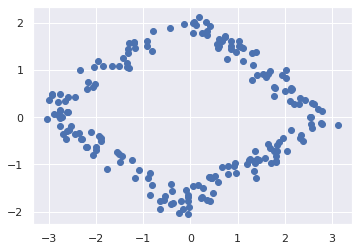

In [29]:
z1 = pca.fit_transform(points)
plt.scatter(z1[:,0],z1[:,1])
plt.axis('scaled');

4 - Refaire les questions précédentes en appliquant sur les données : ```from sklearn.preprocessing import scale```

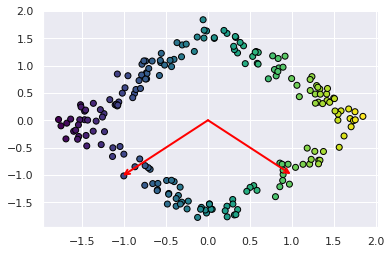

In [30]:
from sklearn.preprocessing import StandardScaler
points_scaled = StandardScaler().fit_transform(points)

c = np.cov(points_scaled.T)

vals, vects = np.linalg.eigh(c)

exp_var = []
for v in vals:
    exp_var += [v / vals.sum()]
    
plt.scatter(points_scaled[:,0],points_scaled[:,1], c=points_scaled[:,0], cmap='viridis',edgecolor="black")
for prct, vector in zip(exp_var, vects):
    v = vector*2*np.sqrt(prct)
    draw_vector([0, 0] , v)

5 - Refaire les questions précédentes en appliquant sur les données : ```from sklearn.preprocessing import normalize```.

vals: 
[0.40241131 0.58538794]
vectors: 
[[-0.99935627 -0.03587554]
 [-0.03587554  0.99935627]]
exp_var: 
[0.40738166814208104, 0.5926183318579189]


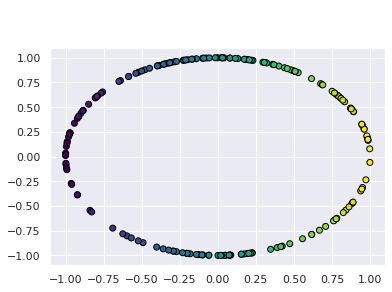

In [31]:
from sklearn.preprocessing import Normalizer
points_scaled = Normalizer().fit_transform(points)

c = np.cov(points_scaled.T)

vals, vects = np.linalg.eigh(c)
print("vals: ")
print(vals)
print("vectors: ")
print(vects)

exp_var = []
for v in vals:
    exp_var += [v / vals.sum()]
print("exp_var: ")
print(exp_var)
    
plt.scatter(points_scaled[:,0],points_scaled[:,1], c=points_scaled[:,0], cmap='viridis',edgecolor="black")
for prct, vector in zip(exp_var, vects):
    v = vector*2*np.sqrt(prct)
    draw_vector([0, 0] , v)

6 - Discutez les différences et quelle méthode doit être utilisée : ```None```, ```scale``` ou ```normalize``` ?

vals: 
[1.3413139  2.90405556]
vectors: 
[[-0.99943222  0.03369326]
 [ 0.03369326  0.99943222]]
exp_var: 
[0.31594750756500506, 0.6840524924349949]


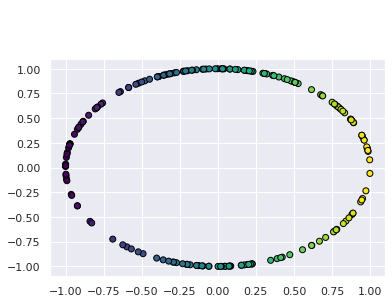

In [32]:
from sklearn.preprocessing import Normalizer

c = np.cov(points.T)

vals, vects = np.linalg.eigh(c)
print("vals: ")
print(vals)
print("vectors: ")
print(vects)

exp_var = []
for v in vals:
    exp_var += [v / vals.sum()]
print("exp_var: ")
print(exp_var)
    
plt.scatter(points_scaled[:,0],points_scaled[:,1], c=points_scaled[:,0], cmap='viridis',edgecolor="black")
for prct, vector in zip(exp_var, vects):
    v = vector*2*np.sqrt(prct)
    draw_vector([0, 0] , v)

- Ce qui change c'est la représentation des données.
- Dans notre exemple, on remarque que `normalize` n'a pas d'effet (meme résultat sans)
- https://stackoverflow.com/questions/60785109/normalization-vs-scaling-for-not-normal-distribution-in-scikit-learn
    - ``So, the main difference is that sklearn.preprocessing.Normalizer scales samples to unit norm (vector lenght) while sklearn.preprocessing.StandardScaler scales features to unit variance, after subtracting the mean. Therefore, the former works on the rows, while the latter on the columns.``

## II - Données réelles

In [33]:
import pandas as pd

### Movielens
1 - A partir du fichier ```./data/movielens_tiny/ratings.csv``` crée une matrice avec une ligne pour chaque utilisateur et une colonne pour chaque film (servez vous de ```pd.read_csv```, ```<df>.pivot```, ```<df>.values```...).

In [34]:
df = pd.read_csv('./data/movielens_tiny/ratings.csv')
df

,userId,movieId,rating,timestamp
0,1,1,4.0,964982703
1,1,3,4.0,964981247
2,1,6,4.0,964982224
3,1,47,5.0,964983815
4,1,50,5.0,964982931
...,...,...,...,...
100831,610,166534,4.0,1493848402
100832,610,168248,5.0,1493850091
100833,610,168250,5.0,1494273047
100834,610,168252,5.0,1493846352


In [35]:
print('unique film: ', df.movieId.nunique())
data = df.pivot(index='userId', columns='movieId', values='rating').fillna(0)
print(data.shape)
data

unique film:  9724
(610, 9724)


movieId,1,2,3,4,5,6,7,8,9,10,...,193565,193567,193571,193573,193579,193581,193583,193585,193587,193609
userId,,,,,,,,,,,,,,,,,,,,,
1,4.0,0.0,4.0,0.0,0.0,4.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
2,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
3,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
4,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
5,4.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
606,2.5,0.0,0.0,0.0,0.0,0.0,2.5,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
607,4.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
608,2.5,2.0,2.0,0.0,0.0,0.0,0.0,0.0,0.0,4.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0


2 - Appliquez PCA.

In [36]:
pca1 = PCA()
pca1_scaled = PCA()
pca1_nrmlzd = PCA()

cmp_data = pca1.fit_transform(data)
cmp_data_scaled = pca1_scaled.fit_transform(StandardScaler().fit_transform(data))
cmp_data_nrmlzd = pca1_nrmlzd.fit_transform(Normalizer().fit_transform(data))

3 - Dessinez les valeurs cumulative des ratios de la variance expliquée par rapport au nombre de composantes (aidez vous de ```np.cumsum```).

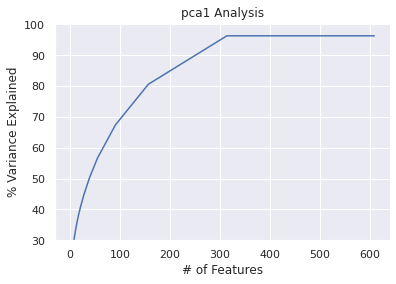

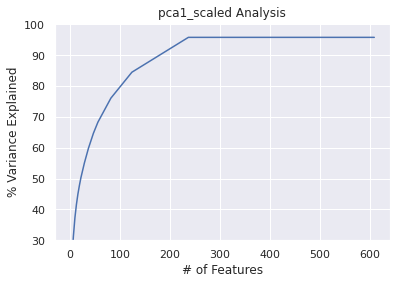

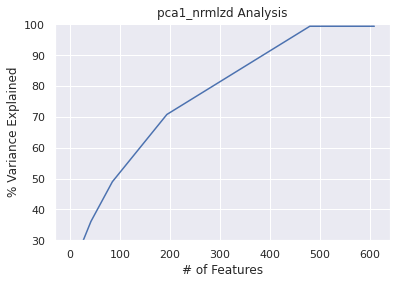

In [37]:
plt.ylabel('% Variance Explained')
plt.xlabel('# of Features')
plt.title('pca1 Analysis')
plt.ylim(30,100.5)
plt.style.context('seaborn-whitegrid')
#var = np.cumsum(pca1.explained_variance_ratio_)
var = np.cumsum(np.round(pca1.explained_variance_ratio_, decimals=3)*100)
plt.plot(var)
plt.show()

plt.ylabel('% Variance Explained')
plt.xlabel('# of Features')
plt.title('pca1_scaled Analysis')
plt.ylim(30,100.5)
plt.style.context('seaborn-whitegrid')
var = np.cumsum(np.round(pca1_scaled.explained_variance_ratio_, decimals=3)*100)
plt.plot(var)
plt.show()

plt.ylabel('% Variance Explained')
plt.xlabel('# of Features')
plt.title('pca1_nrmlzd Analysis')
plt.ylim(30,100.5)
plt.style.context('seaborn-whitegrid')
var = np.cumsum(np.round(pca1_nrmlzd.explained_variance_ratio_, decimals=3)*100)
plt.plot(var)
plt.show()

4 - Discutez la courbe cumulative. Que peut-on faire avec les résultats de cette PCA ?

- On remarque encore une fois que le scale/normlz impacte sur la représentation des données.
- On remarque que à partir de ~120 il y a une première courbure.
- On remarque que à ~230 feature la variance atteint une limite.
- Il faut ~250 features pour exprimer le dataset

### Decathlon
1 - A partir du fichier ```./data/decathlon.csv``` créez une matrice avec comme colonnes les résultats pour les dix sports et des lignes pour chaque résultat d'un sportif (servez vous de ```pd.read_csv```, ```<df>.drop```, ```<df>.values```...).

In [38]:
from sklearn import preprocessing

data2 = pd.read_csv('./data/decathlon.csv')  
data2

,Athlets,100m,Long.jump,Shot.put,High.jump,400m,110m.hurdle,Discus,Pole.vault,Javeline,1500m,Rank,Points,Competition
0,SEBRLE,11.04,7.58,14.83,2.07,49.81,14.69,43.75,5.02,63.19,291.70,1,8217,Decastar
1,CLAY,10.76,7.40,14.26,1.86,49.37,14.05,50.72,4.92,60.15,301.50,2,8122,Decastar
2,KARPOV,11.02,7.30,14.77,2.04,48.37,14.09,48.95,4.92,50.31,300.20,3,8099,Decastar
3,BERNARD,11.02,7.23,14.25,1.92,48.93,14.99,40.87,5.32,62.77,280.10,4,8067,Decastar
4,YURKOV,11.34,7.09,15.19,2.10,50.42,15.31,46.26,4.72,63.44,276.40,5,8036,Decastar
5,WARNERS,11.11,7.60,14.31,1.98,48.68,14.23,41.10,4.92,51.77,278.10,6,8030,Decastar
6,ZSIVOCZKY,11.13,7.30,13.48,2.01,48.62,14.17,45.67,4.42,55.37,268.00,7,8004,Decastar
7,McMULLEN,10.83,7.31,13.76,2.13,49.91,14.38,44.41,4.42,56.37,285.10,8,7995,Decastar
8,MARTINEAU,11.64,6.81,14.57,1.95,50.14,14.93,47.60,4.92,52.33,262.10,9,7802,Decastar
9,HERNU,11.37,7.56,14.41,1.86,51.10,15.06,44.99,4.82,57.19,285.10,10,7733,Decastar


2 - Appliquez PCA.

In [39]:
data2_clean = data2.drop(["Athlets", "Competition"], axis=1)

In [40]:
pca2 = PCA()
pca2_scaled = PCA()
pca2_nrmlzd = PCA()

cmp_data2 = pca2.fit_transform(data2_clean)
cmp_data2_scaled = pca2_scaled.fit_transform(StandardScaler().fit_transform(data2_clean))
cmp_data2_nrmlzd = pca2_nrmlzd.fit_transform(Normalizer().fit_transform(data2_clean))

3 - Dessinez les valeurs cumulative des ratios de la variance expliquée par rapport au nombre de composantes.

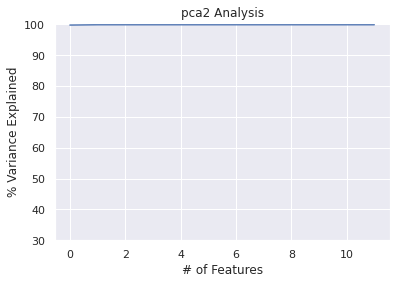

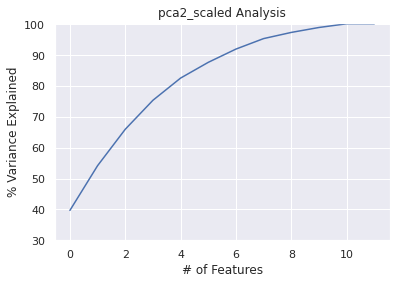

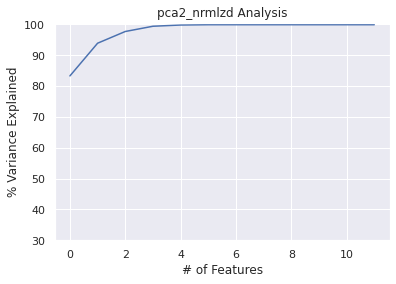

In [41]:
plt.ylabel('% Variance Explained')
plt.xlabel('# of Features')
plt.title('pca2 Analysis')
plt.ylim(30,100.5)
plt.style.context('seaborn-whitegrid')
#var = np.cumsum(pca1.explained_variance_ratio_)
var = np.cumsum(np.round(pca2.explained_variance_ratio_, decimals=3)*100)
plt.plot(var)
plt.show()

plt.ylabel('% Variance Explained')
plt.xlabel('# of Features')
plt.title('pca2_scaled Analysis')
plt.ylim(30,100.5)
plt.style.context('seaborn-whitegrid')
var = np.cumsum(np.round(pca2_scaled.explained_variance_ratio_, decimals=3)*100)
plt.plot(var)
plt.show()

plt.ylabel('% Variance Explained')
plt.xlabel('# of Features')
plt.title('pca2_nrmlzd Analysis')
plt.ylim(30,100.5)
plt.style.context('seaborn-whitegrid')
var = np.cumsum(np.round(pca2_nrmlzd.explained_variance_ratio_, decimals=3)*100)
plt.plot(var)
plt.show()

4 - Discutez la courbe cumulative. Que peut-on faire avec les résultats de cette PCA ?

- La représentation des données influe beaucoup !
- On peut dire qu'il faut 2 composantes (?)

5 - Faites une figure 2D avec comme axes les CPs 1 et 2. Ajoutez y des vecteurs représentant les dix sports. 

Indice : $s = [1,0,0\ldots]$ représente le sport N°1 dans l'espace précédant la PCA. 

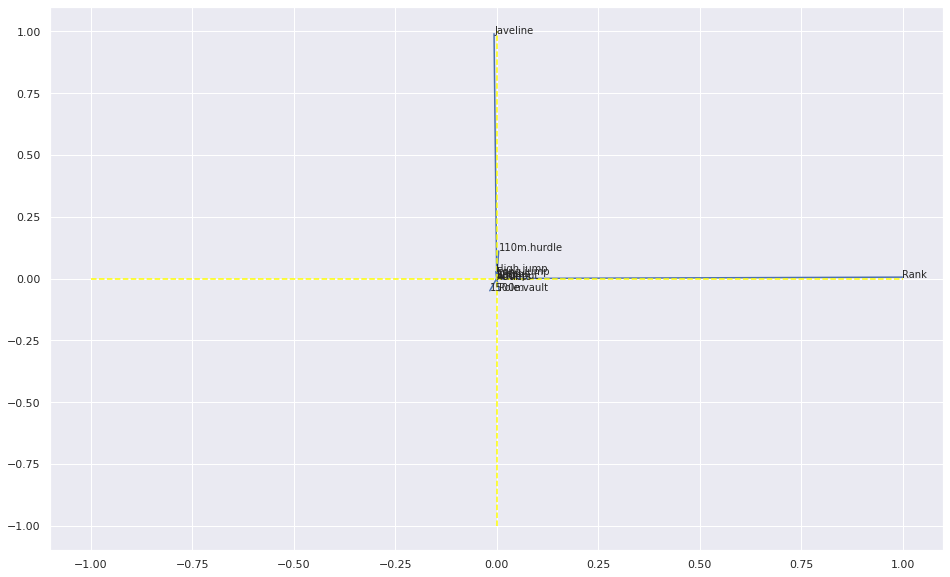

In [42]:
plt.figure(figsize=(16,10))
for i, (x, y) in enumerate(zip(pca2.components_[0, :], pca2.components_[1, :])):
    plt.plot([0, x], [0, y], color='b')
    plt.text(x, y, data2.columns[i], fontsize='10')

plt.plot([-1, 1], [0, 0], color='yellow', ls='--')
plt.plot([0, 0], [-1, 1], color='yellow', ls='--')

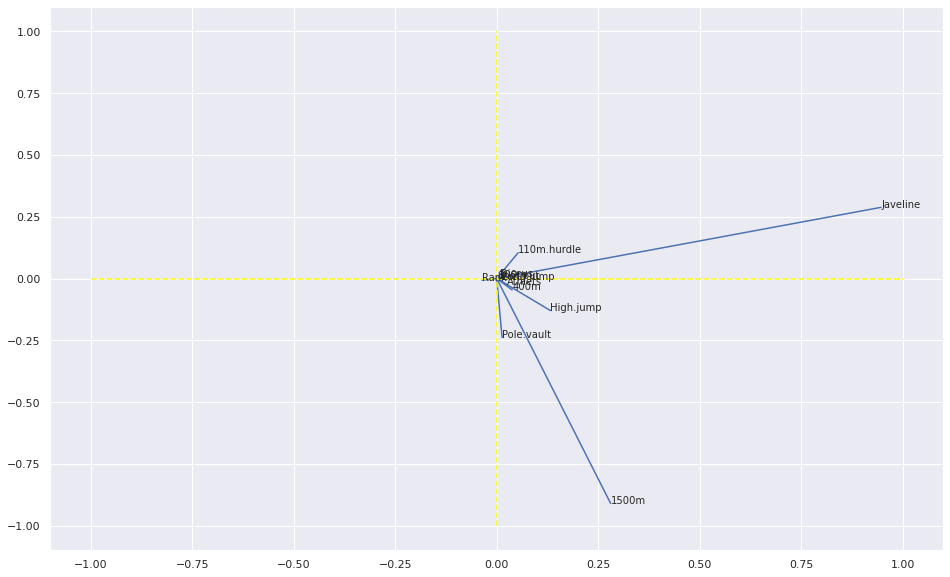

In [43]:
plt.figure(figsize=(16,10))
for i, (x, y) in enumerate(zip(pca2_nrmlzd.components_[0, :], pca2_nrmlzd.components_[1, :])):
    plt.plot([0, x], [0, y], color='b')
    plt.text(x, y, data2.columns[i], fontsize='10')

plt.plot([-1, 1], [0, 0], color='yellow', ls='--')
plt.plot([0, 0], [-1, 1], color='yellow', ls='--')

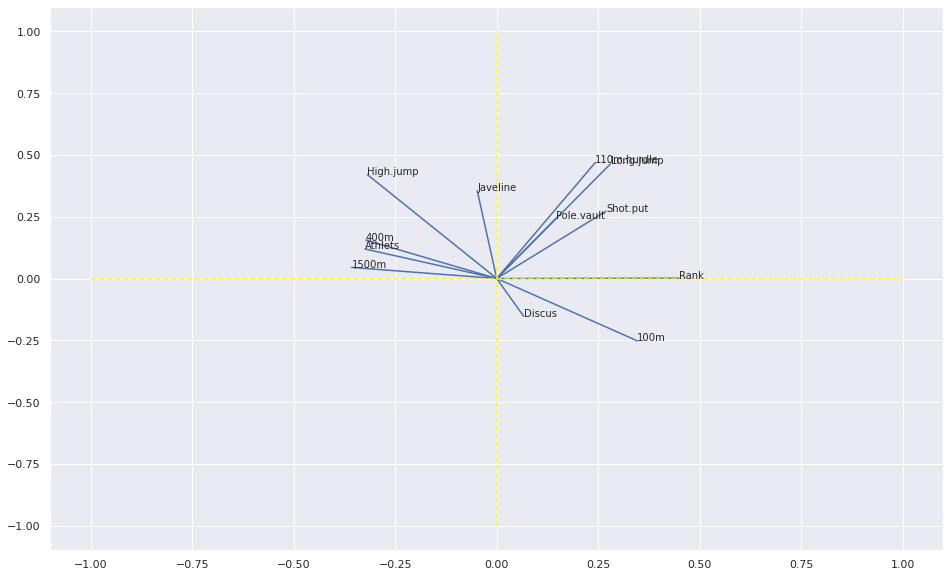

In [44]:
plt.figure(figsize=(16,10))
for i, (x, y) in enumerate(zip(pca2_scaled.components_[0, :], pca2_scaled.components_[1, :])):
    plt.plot([0, x], [0, y], color='b')
    plt.text(x, y, data2.columns[i], fontsize='10')

plt.plot([-1, 1], [0, 0], color='yellow', ls='--')
plt.plot([0, 0], [-1, 1], color='yellow', ls='--')

- On remarque que le scale arrive à bien séparer nos données.

### MNIST (oui encore)

1 - A partir du fichier ```./data/mnist_tiny.csv``` créez une matrice avec une ligne par dessin et comme colonnes la suite de pixels.

In [45]:
data3 = pd.read_csv('./data/mnist_tiny.csv')  
data3

,label,1x1,1x2,1x3,1x4,1x5,1x6,1x7,1x8,1x9,...,28x19,28x20,28x21,28x22,28x23,28x24,28x25,28x26,28x27,28x28
0,7,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
1,2,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
2,1,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
3,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
4,4,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
9995,2,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
9996,3,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
9997,4,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
9998,5,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0


In [46]:
data3.describe()

,label,1x1,1x2,1x3,1x4,1x5,1x6,1x7,1x8,1x9,...,28x19,28x20,28x21,28x22,28x23,28x24,28x25,28x26,28x27,28x28
count,10000.000000,10000.0,10000.0,10000.0,10000.0,10000.0,10000.0,10000.0,10000.0,10000.0,...,10000.000000,10000.000000,10000.000000,10000.0000,10000.0,10000.0,10000.0,10000.0,10000.0,10000.0
mean,4.443400,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.179300,0.163600,0.052600,0.0006,0.0,0.0,0.0,0.0,0.0,0.0
std,2.895865,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,5.674149,5.736072,2.420004,0.0600,0.0,0.0,0.0,0.0,0.0,0.0
min,0.000000,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.000000,0.000000,0.000000,0.0000,0.0,0.0,0.0,0.0,0.0,0.0
25%,2.000000,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.000000,0.000000,0.000000,0.0000,0.0,0.0,0.0,0.0,0.0,0.0
50%,4.000000,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.000000,0.000000,0.000000,0.0000,0.0,0.0,0.0,0.0,0.0,0.0
75%,7.000000,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.000000,0.000000,0.000000,0.0000,0.0,0.0,0.0,0.0,0.0,0.0
max,9.000000,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,253.000000,253.000000,156.000000,6.0000,0.0,0.0,0.0,0.0,0.0,0.0


In [47]:
data3.label.nunique()

10

In [48]:
data3_clean = data3.drop(['label'], axis=1)
data3_clean

,1x1,1x2,1x3,1x4,1x5,1x6,1x7,1x8,1x9,1x10,...,28x19,28x20,28x21,28x22,28x23,28x24,28x25,28x26,28x27,28x28
0,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
1,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
2,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
3,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
4,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
9995,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
9996,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
9997,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
9998,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0


2 - Appliquez PCA.

In [49]:
pca3 = PCA()
pca3_scaled = PCA()
pca3_nrmlzd = PCA()

cmp_data3 = pca3.fit_transform(data3_clean)
cmp_data3_scaled = pca3_scaled.fit_transform(StandardScaler().fit_transform(data3_clean))
cmp_data3_nrmlzd = pca3_nrmlzd.fit_transform(Normalizer().fit_transform(data3_clean))

In [50]:
print("pca3.n_components_: ", pca3.n_components_)
print("pca3_scaled.n_components_: ", pca3_scaled.n_components_)
print("pca3_nrmlzd.n_components_: ", pca3_nrmlzd.n_components_)

pca3.n_components_:  784
pca3_scaled.n_components_:  784
pca3_nrmlzd.n_components_:  784


3 - Dessinez les valeurs cumulative des ratios de la variance expliquée par rapport au nombre de composantes.

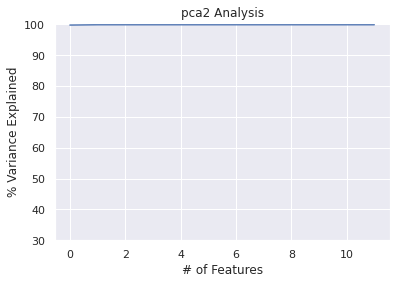

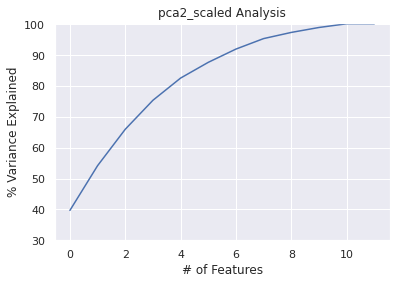

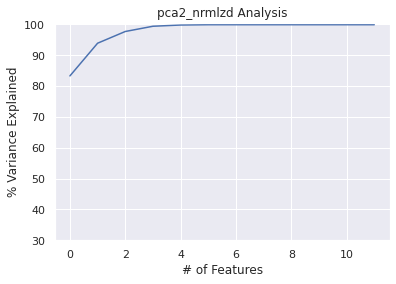

In [51]:
plt.ylabel('% Variance Explained')
plt.xlabel('# of Features')
plt.title('pca2 Analysis')
plt.ylim(30,100.5)
plt.style.context('seaborn-whitegrid')
#var = np.cumsum(pca1.explained_variance_ratio_)
var = np.cumsum(np.round(pca2.explained_variance_ratio_, decimals=3)*100)
plt.plot(var)
plt.show()

plt.ylabel('% Variance Explained')
plt.xlabel('# of Features')
plt.title('pca2_scaled Analysis')
plt.ylim(30,100.5)
plt.style.context('seaborn-whitegrid')
var = np.cumsum(np.round(pca2_scaled.explained_variance_ratio_, decimals=3)*100)
plt.plot(var)
plt.show()

plt.ylabel('% Variance Explained')
plt.xlabel('# of Features')
plt.title('pca2_nrmlzd Analysis')
plt.ylim(30,100.5)
plt.style.context('seaborn-whitegrid')
var = np.cumsum(np.round(pca2_nrmlzd.explained_variance_ratio_, decimals=3)*100)
plt.plot(var)
plt.show()

4 - Discutez la courbe cumulative. Que peut-on faire avec les résultats de cette PCA ?

- On remarque encore une fois que le scale/normlz impacte sur la représentation des données.
- Il faut 2 features pour exprimer le dataset

5 - Dessinez les données projetées sur les deux premières CPs.

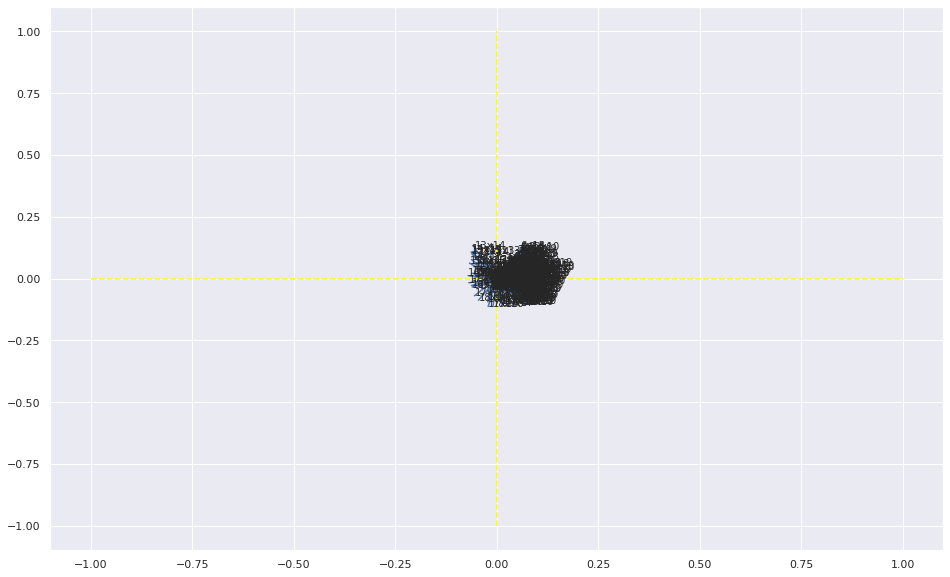

In [52]:
plt.figure(figsize=(16,10))
for i, (x, y) in enumerate(zip(pca3.components_[0, :], pca3.components_[1, :])):
    plt.plot([0, x], [0, y], color='b')
    plt.text(x, y, data3.columns[i], fontsize='10')

plt.plot([-1, 1], [0, 0], color='yellow', ls='--')
plt.plot([0, 0], [-1, 1], color='yellow', ls='--')

In [65]:
fig = px.scatter(cmp_data3, x=0, y=1, color=data3['label'])
fig.show()

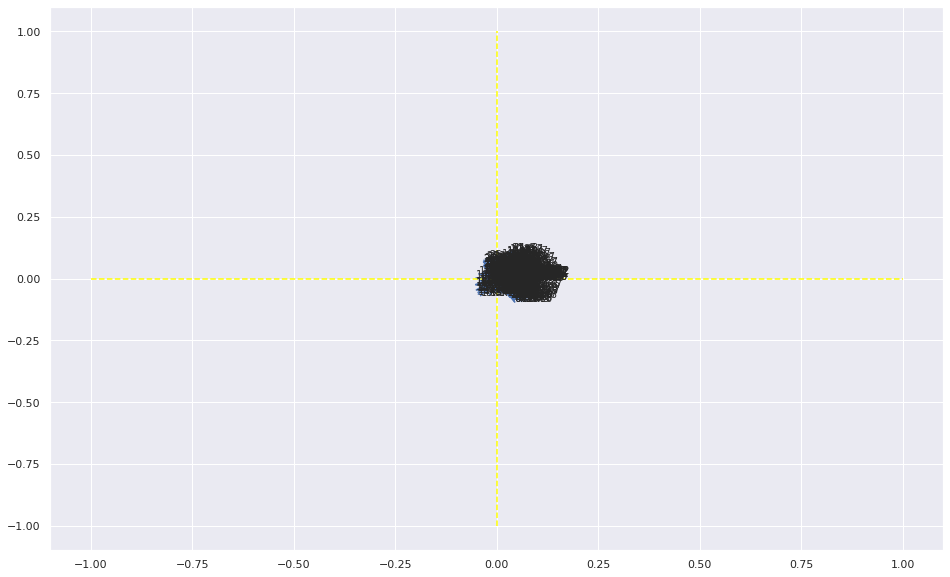

In [53]:
plt.figure(figsize=(16,10))
for i, (x, y) in enumerate(zip(pca3_scaled.components_[0, :], pca3_scaled.components_[1, :])):
    plt.plot([0, x], [0, y], color='b')
    plt.text(x, y, data3.columns[i], fontsize='10')

plt.plot([-1, 1], [0, 0], color='yellow', ls='--')
plt.plot([0, 0], [-1, 1], color='yellow', ls='--')

In [66]:
fig = px.scatter(cmp_data3_scaled, x=0, y=1, color=data3['label'])
fig.show()

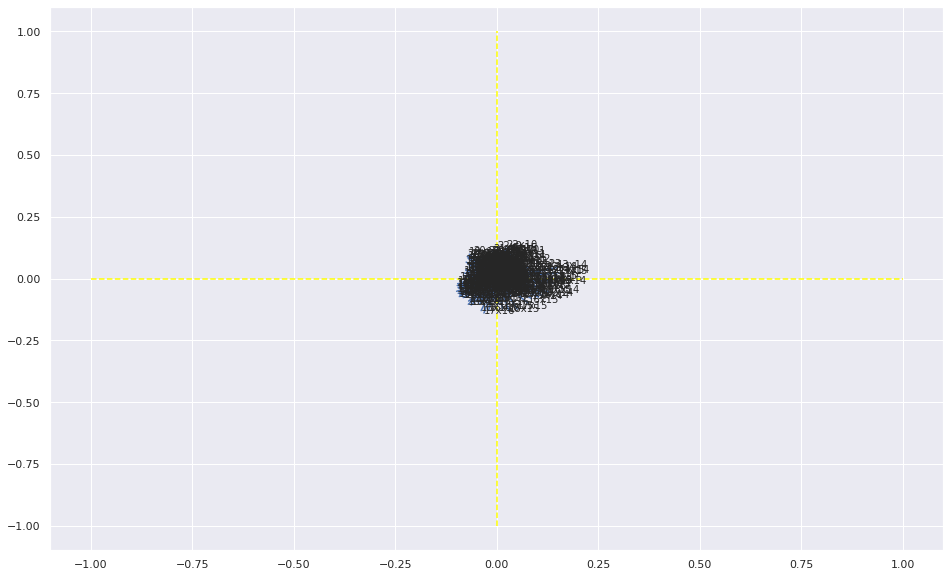

In [54]:
plt.figure(figsize=(16,10))
for i, (x, y) in enumerate(zip(pca3_nrmlzd.components_[0, :], pca3_nrmlzd.components_[1, :])):
    plt.plot([0, x], [0, y], color='b')
    plt.text(x, y, data3.columns[i], fontsize='10')

plt.plot([-1, 1], [0, 0], color='yellow', ls='--')
plt.plot([0, 0], [-1, 1], color='yellow', ls='--')

In [67]:
fig = px.scatter(cmp_data3_nrmlzd, x=0, y=1, color=data3['label'])
fig.show()

6 - Dessinez le centre des données projetées de chaque chiffre (avec par exemple ```<df>.groupby('label').mean().reset_index()```). 

- Source: https://plotly.com/python/pca-visualization/

In [55]:
pca4 = PCA(n_components=2)
pca4_scaled = PCA(n_components=2)
pca4_nrmlzd = PCA(n_components=2)

cmp_data3 = pca4.fit_transform(data3_clean)
cmp_data3_scaled = pca4_scaled.fit_transform(StandardScaler().fit_transform(data3_clean))
cmp_data3_nrmlzd = pca4_nrmlzd.fit_transform(Normalizer().fit_transform(data3_clean))

In [56]:
loadings = pca4.components_.T * np.sqrt(pca4.explained_variance_)

fig = px.scatter(cmp_data3, x=0, y=1, color=data3['label'], title='pca4')

features = np.arange(10)
for i, feature in enumerate(features):
    fig.add_shape(
        type='line',
        x0=0, y0=0,
        x1=loadings[i, 0],
        y1=loadings[i, 1]
    )
    fig.add_annotation(
        x=loadings[i, 0],
        y=loadings[i, 1],
        ax=0, ay=0,
        xanchor="center",
        yanchor="bottom",
        text=str(feature),
    )
fig.show()

In [57]:
loadings = pca4_scaled.components_.T * np.sqrt(pca4_scaled.explained_variance_)

fig = px.scatter(cmp_data3_scaled, x=0, y=1, color=data3['label'], title='pca4_scaled')

features = np.arange(10)
for i, feature in enumerate(features):
    fig.add_shape(
        type='line',
        x0=0, y0=0,
        x1=loadings[i, 0],
        y1=loadings[i, 1]
    )
    fig.add_annotation(
        x=loadings[i, 0],
        y=loadings[i, 1],
        ax=0, ay=0,
        xanchor="center",
        yanchor="bottom",
        text=str(feature),
    )
fig.show()

In [58]:
loadings = pca4_nrmlzd.components_.T * np.sqrt(pca4_nrmlzd.explained_variance_)

fig = px.scatter(cmp_data3_nrmlzd, x=0, y=1, color=data3['label'], title='pca4_nrmlzd')

features = np.arange(10)
for i, feature in enumerate(features):
    fig.add_shape(
        type='line',
        x0=0, y0=0,
        x1=loadings[i, 0],
        y1=loadings[i, 1]
    )
    fig.add_annotation(
        x=loadings[i, 0],
        y=loadings[i, 1],
        ax=0, ay=0,
        xanchor="center",
        yanchor="bottom",
        text=str(feature),
    )
fig.show()